To address the poor generalization observed in direct transfer learning, we insert modality-specific feature adapters at multiple strategic locations within the UNet++ architecture. This allows us to retain the useful representations learned from brain MRI while effectively adapting them to the CT domain. By resolving modality mismatches at various levels — from low-level texture differences to high-level semantic features — this approach enables the model to generalize better for liver tumor segmentation in CT scans.

## Modality-Specific Feature Adapters in UNet++

### Purpose

Modality-Specific Feature Adapters are lightweight convolutional modules inserted between layers or blocks of a pretrained model. They serve the following purposes:

- **Adapt feature representations**: Reinterpret the feature maps learned from one imaging modality (e.g., brain MRI) to make them suitable for another modality (e.g., liver CT).
- **Prevent catastrophic forgetting**: Preserve the original features learned from the source modality while enabling adaptation to a new domain.
- **Learn modality transformation**: Act as transformation layers that fine-tune the feature space without retraining the entire network.

---

### Where to Insert in UNet++

##### Adapter Insertion Plan

| Adapter Location         | Purpose                                                         | Why Use It Here?                                                      |
|--------------------------|------------------------------------------------------------------|------------------------------------------------------------------------|
| **Input Adapter**        | Normalize CT input to approximate MRI contrast/textures         | Helps encoder handle unfamiliar intensity patterns                     |
| **Encoder Output**       | Transform deep feature maps before decoding                     | Aligns high-level representations with CT semantics                    |
| **Skip Connections**     | Adapt shallow features before concatenation in decoder          | Refines early features (edges, gradients) for CT textures              |
| **Decoder Inputs**       | Re-adapt reused MRI decoder features (if decoder is reused)     | Rare, but helpful if decoder is also pretrained                        |
| **Bottleneck (conv40)**  | Project latent feature space into CT domain                     | Most critical point where deep semantic features may remain MRI-biased |


Each adapter block typically consists of the following structure:
Conv2D → BatchNormalization → ReLU




---

### Why This Approach Helps

MRI and CT differ in several ways:

- Texture patterns  
- Intensity distributions  
- Noise characteristics  

Adapter blocks allow the model to reinterpret MRI-derived features so they can be used effectively for CT segmentation tasks. This helps improve performance in cross-modality transfer learning without retraining the full encoder.


##Model:freeze only first layer(conv00)



##Model4:freeze only first layer(conv00)

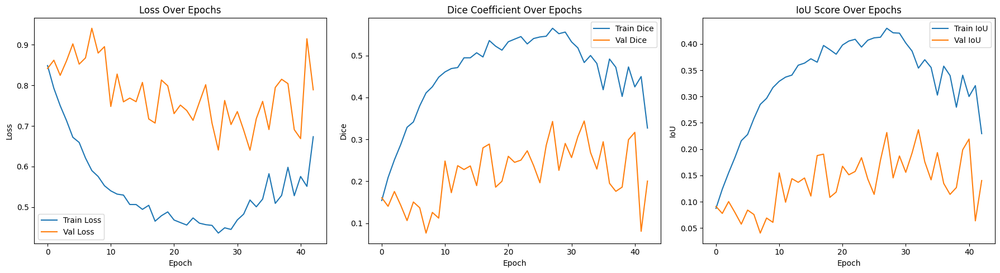

###ُEvaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###ُEvaluate on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Mode2:freeze first two layers(conv00 and conv10)

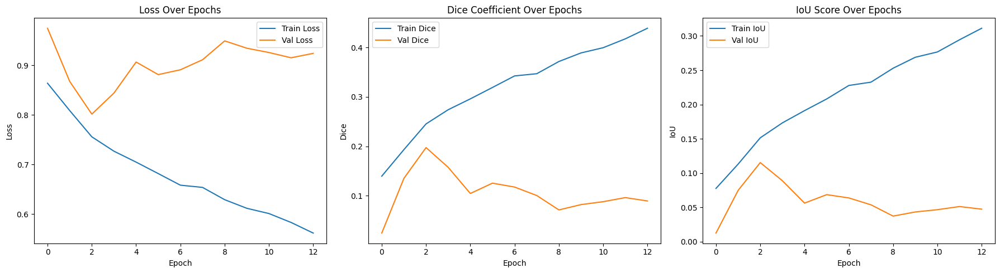

###Evaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_twolayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_twolayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model3::Freeze first three layers(conv00,conv 10 and conv 20)

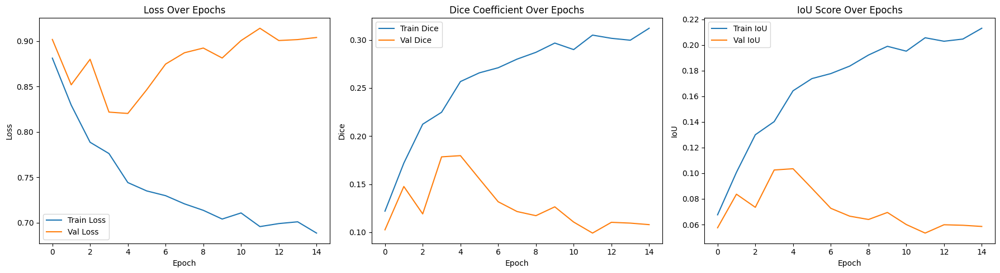

###Evaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_threelayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on *testset*

# New Section

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_threelayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model 4:freeze four layers in encoder(conv 00,con10,con20 conv30)

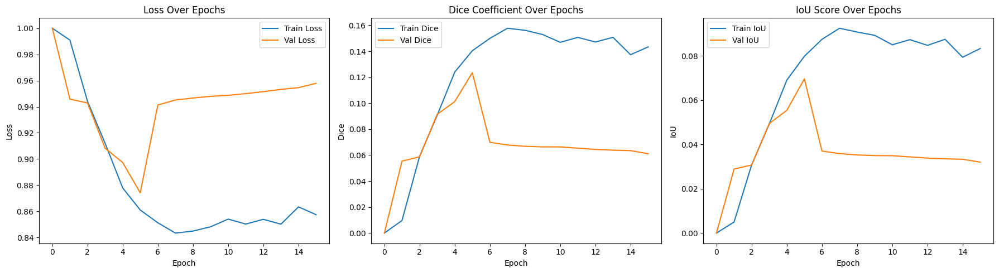

###ُEvaluation on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fourlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fourlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model5:Freeze encoder and bottlneck

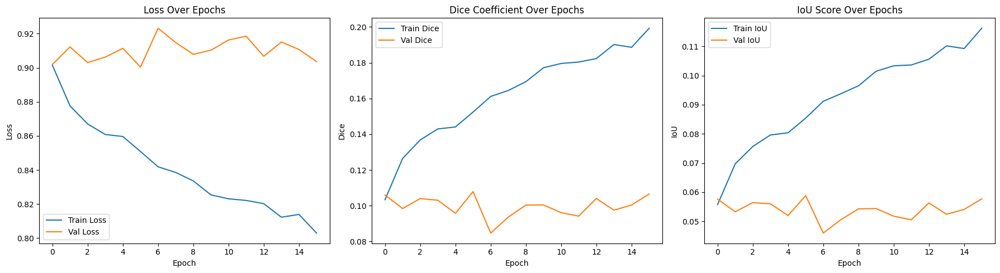

###Evaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fivelayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fivelayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##’Model6:Freeze shallow nested decoders conv01, conv11, conv21, conv31

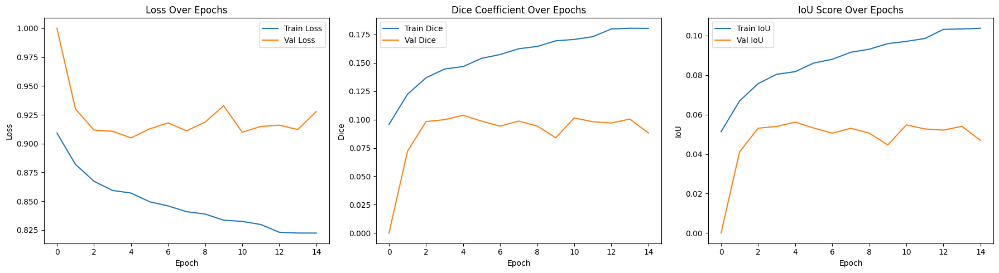

###Evaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloowlayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test set

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloowlayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model7: Freeze encoder + more nested decoders

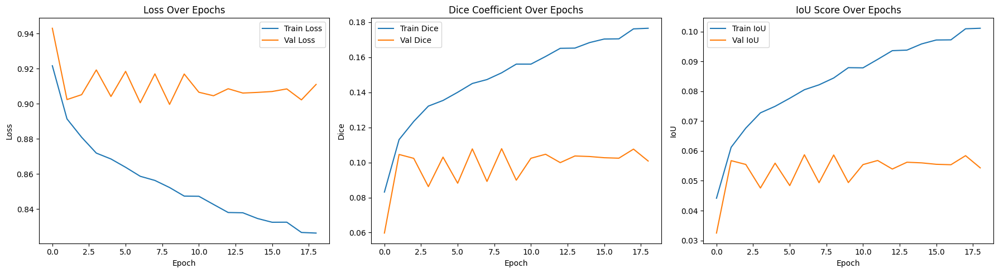

###Evaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_morelayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_morelayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model8:Freeze encoder + deeper nested decoders

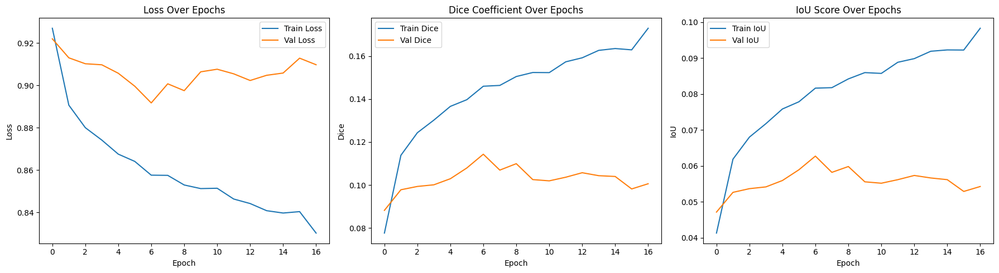

###Evaluate on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_deeperlayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evalauetion on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_deeperlayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model9:Freeze initial Dense encoder

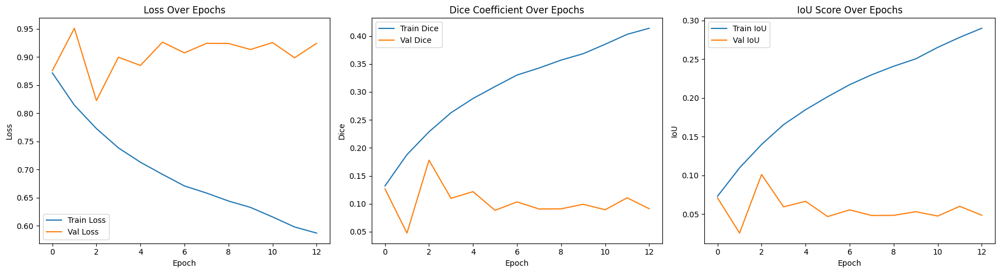

###Evaluation on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_denselayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_denselayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model10:freeze initial_second Dense encoder

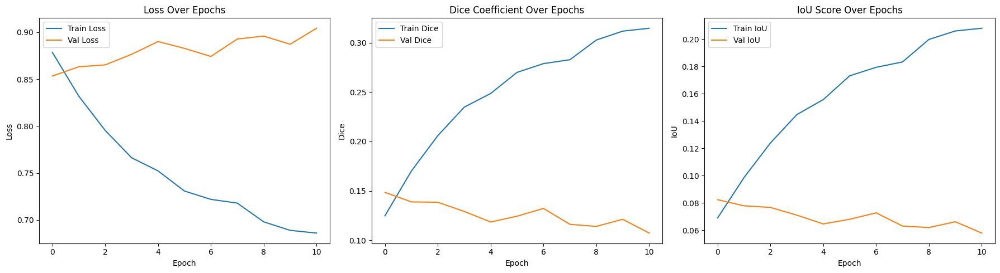

###Evaluation on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_seconddenselayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on testset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_seconddenselayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Modell11:Freeze initial second third dense layers



1.   List item
2.   List item

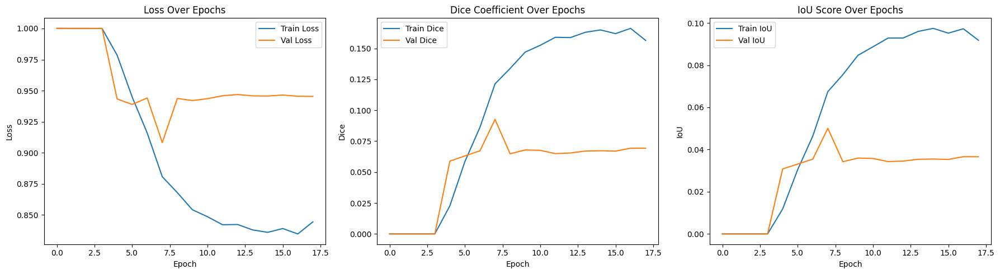

###Evaluation on validset

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_second_third_denselayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
tion

###Evaluation on testset


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_second_third_denselayers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

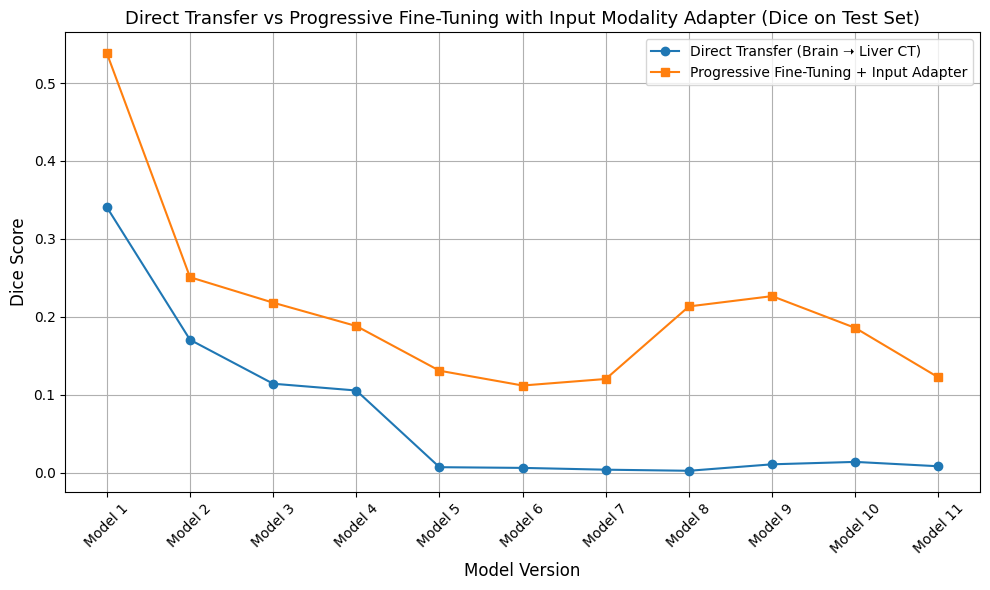

In [ ]:
import matplotlib.pyplot as plt

# Dice scores from the images
# First image: Direct transfer (more layers frozen as you go down)
direct_transfer_dice = [0.3407, 0.1706, 0.1142, 0.1055, 0.0071, 0.0062, 0.0039, 0.0025, 0.0108, 0.0139, 0.0083]

# Second image: Progressive fine-tuning with input modality adapter
progressive_finetune_dice = [0.5383, 0.2509, 0.2182, 0.1882, 0.1309, 0.1119, 0.1203, 0.2134, 0.2266, 0.1858, 0.1223]

# Update x-axis labels to be model1, model2, ..., model11
x_labels = [f"Model {i+1}" for i in range(len(direct_transfer_dice))]

# Update title to reflect the full description provided by the user
plt.figure(figsize=(10, 6))
plt.plot(x_labels, direct_transfer_dice, marker='o', label='Direct Transfer (Brain ➝ Liver CT)')
plt.plot(x_labels, progressive_finetune_dice, marker='s', label='Progressive Fine-Tuning + Input Adapter')
plt.xlabel("Model Version", fontsize=12)
plt.ylabel("Dice Score", fontsize=12)
plt.title("Direct Transfer vs Progressive Fine-Tuning with Input Modality Adapter (Dice on Test Set)", fontsize=13)
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



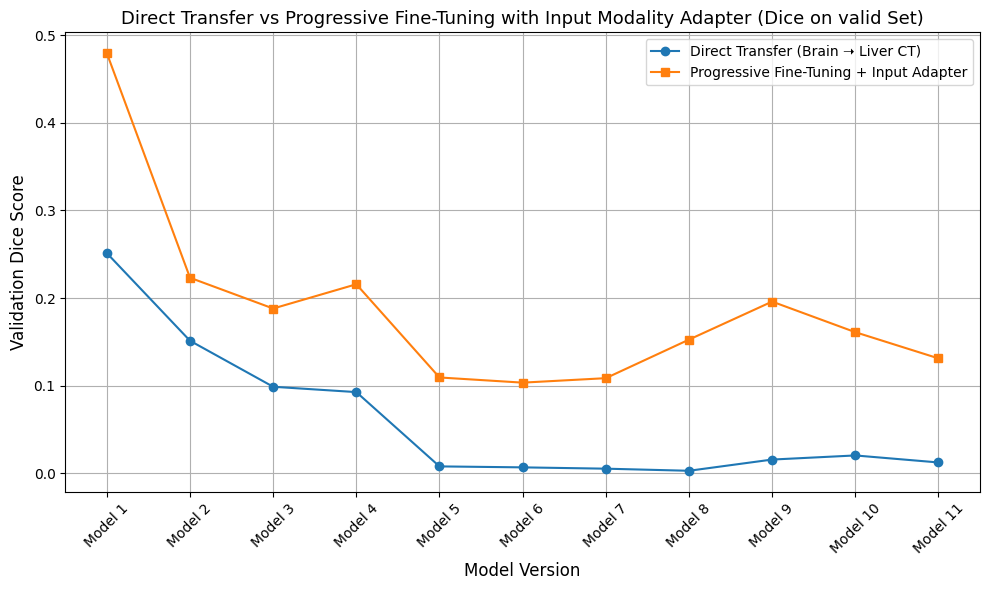

In [ ]:
import matplotlib.pyplot as plt

# Validation Dice scores from screenshots
valid_direct_transfer = [0.2512, 0.1512, 0.0987, 0.0926, 0.0078, 0.0067, 0.0052, 0.0028, 0.0156, 0.0203, 0.0123]
valid_progressive_finetune = [0.4794, 0.2231, 0.1880, 0.2157, 0.1093, 0.1034, 0.1085, 0.1525, 0.1959, 0.1610, 0.1311]

x_labels = [f"Model {i+1}" for i in range(len(valid_direct_transfer))]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x_labels, valid_direct_transfer, marker='o', label='Direct Transfer (Brain ➝ Liver CT)')
plt.plot(x_labels, valid_progressive_finetune, marker='s', label='Progressive Fine-Tuning + Input Adapter')
plt.xlabel("Model Version", fontsize=12)
plt.ylabel("Validation Dice Score", fontsize=12)
plt.title("Direct Transfer vs Progressive Fine-Tuning with Input Modality Adapter (Dice on valid Set)", fontsize=13)
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


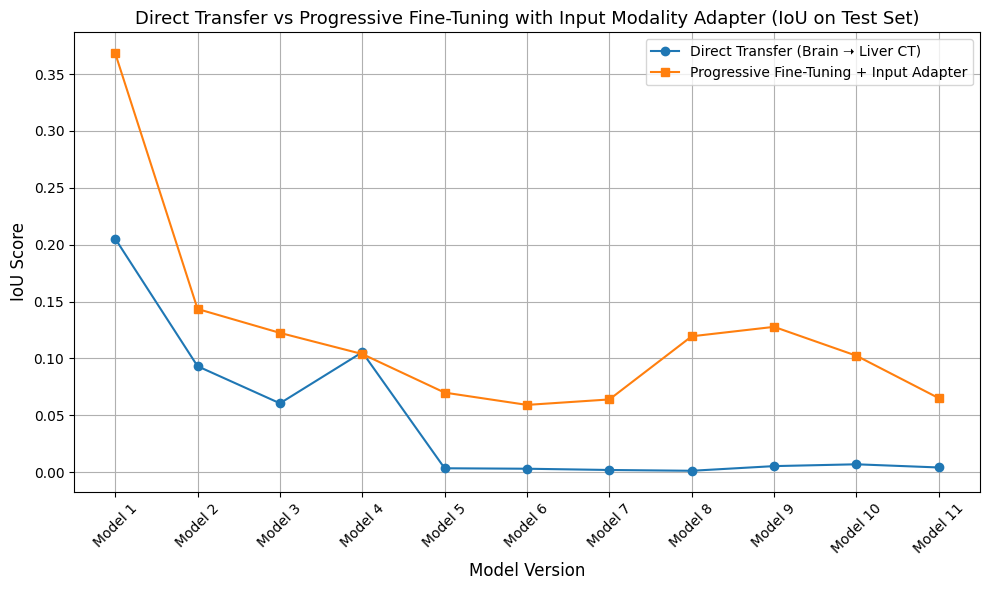

In [ ]:
import matplotlib.pyplot as plt

# IoU scores from the uploaded images
direct_transfer_iou = [0.2053, 0.0932, 0.0606, 0.1055, 0.0035, 0.0031, 0.0020, 0.0013, 0.0054, 0.0070, 0.0042]
progressive_finetune_iou = [0.3683, 0.1435, 0.1225, 0.1039, 0.0700, 0.0592, 0.0640, 0.1195, 0.1278, 0.1024, 0.0651]

# X-axis labels
x_labels = [f"Model {i+1}" for i in range(len(direct_transfer_iou))]

# Plot IoU comparison
plt.figure(figsize=(10, 6))
plt.plot(x_labels, direct_transfer_iou, marker='o', label='Direct Transfer (Brain ➝ Liver CT)')
plt.plot(x_labels, progressive_finetune_iou, marker='s', label='Progressive Fine-Tuning + Input Adapter')
plt.xlabel("Model Version", fontsize=12)
plt.ylabel("IoU Score", fontsize=12)
plt.title("Direct Transfer vs Progressive Fine-Tuning with Input Modality Adapter (IoU on Test Set)", fontsize=13)
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


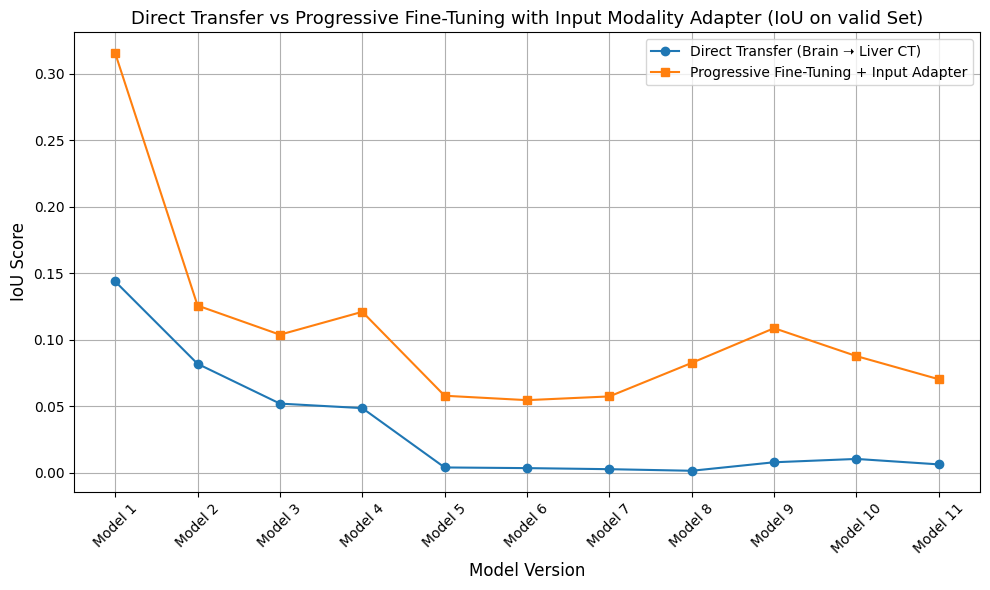

In [ ]:
import matplotlib.pyplot as plt

# IoU scores from the uploaded images
direct_transfer_iou =[0.1437, 0.0818, 0.0519, 0.0485, 0.0039, 0.0034, 0.0026, 0.0014, 0.0078, 0.0103, 0.0062]

progressive_finetune_iou =[0.3153, 0.1256, 0.1037, 0.1209, 0.0578, 0.0545, 0.0573, 0.0825, 0.1086, 0.0876, 0.0702]


# X-axis labels
x_labels = [f"Model {i+1}" for i in range(len(direct_transfer_iou))]

# Plot IoU comparison
plt.figure(figsize=(10, 6))
plt.plot(x_labels, direct_transfer_iou, marker='o', label='Direct Transfer (Brain ➝ Liver CT)')
plt.plot(x_labels, progressive_finetune_iou, marker='s', label='Progressive Fine-Tuning + Input Adapter')
plt.xlabel("Model Version", fontsize=12)
plt.ylabel("IoU Score", fontsize=12)
plt.title("Direct Transfer vs Progressive Fine-Tuning with Input Modality Adapter (IoU on valid Set)", fontsize=13)
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


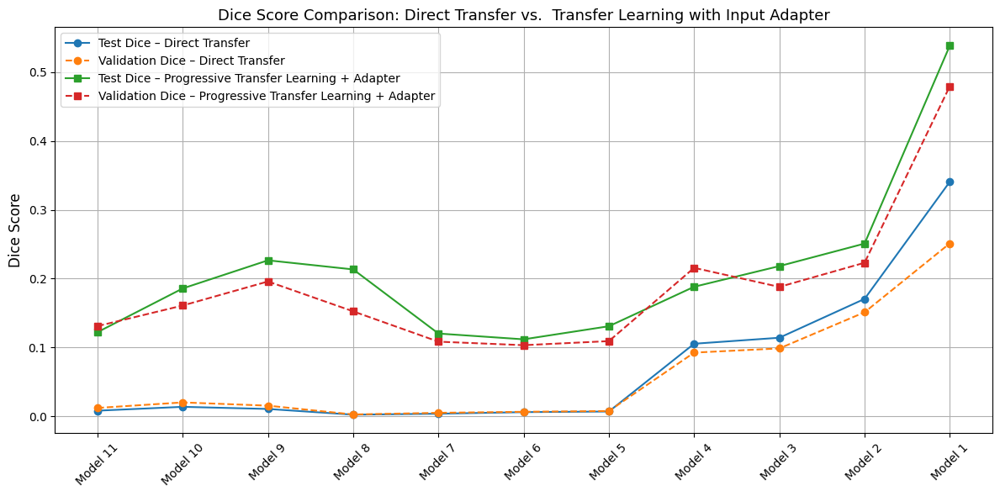

In [ ]:
import matplotlib.pyplot as plt

# Original Dice scores (Model 1 to Model 11)
test_dice_direct = [0.3407, 0.1706, 0.1142, 0.1055, 0.0071, 0.0062, 0.0039, 0.0025, 0.0108, 0.0139, 0.0083]
valid_dice_direct = [0.2512, 0.1512, 0.0987, 0.0926, 0.0078, 0.0067, 0.0052, 0.0028, 0.0156, 0.0203, 0.0123]

test_dice_progressive = [0.5383, 0.2509, 0.2182, 0.1882, 0.1309, 0.1119, 0.1203, 0.2134, 0.2266, 0.1858, 0.1223]
valid_dice_progressive = [0.4794, 0.2231, 0.1880, 0.2157, 0.1093, 0.1034, 0.1085, 0.1525, 0.1959, 0.1610, 0.1311]

# Reverse all values to align with Model 11 → Model 1
test_dice_direct = test_dice_direct[::-1]
valid_dice_direct = valid_dice_direct[::-1]
test_dice_progressive = test_dice_progressive[::-1]
valid_dice_progressive = valid_dice_progressive[::-1]

# X-axis labels from Model 11 to Model 1
x_labels = [f"Model {i}" for i in range(11, 0, -1)]

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(x_labels, test_dice_direct, marker='o', label='Test Dice – Direct Transfer')
plt.plot(x_labels, valid_dice_direct, marker='o', linestyle='--', label='Validation Dice – Direct Transfer')
plt.plot(x_labels, test_dice_progressive, marker='s', label='Test Dice – Progressive Transfer Learning + Adapter')
plt.plot(x_labels, valid_dice_progressive, marker='s', linestyle='--', label='Validation Dice – Progressive Transfer Learning + Adapter')

plt.ylabel("Dice Score", fontsize=12)
plt.title("Dice Score Comparison: Direct Transfer vs.  Transfer Learning with Input Adapter", fontsize=13)
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model Function ===
def load_model_with_weights(model_path, input_shape=(512, 512, 1)):
    model_instance = UNetPlusPlus(input_shape=input_shape)
    model = model_instance.BuildNetwork()
    model.load_weights(model_path)
    return model

# === Set Directories and Load Images ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)
# === Define Your Model Paths ===
model_paths = [
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_twolayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_threelayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fourlayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fivelayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloowlayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_morelayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_deeperlayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_denselayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_seconddenselayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_second_third_denselayers.h5"
]

# === Load All Models ===
models = [load_model_with_weights(path) for path in model_paths]

# === Predict and Visualize in One Row ===
for i in range(len(images)):
    image = np.expand_dims(images[i], axis=0)
    preds_all = [(model.predict(image) > 0.5).astype(np.float32).squeeze() for model in models]

    plt.figure(figsize=(40, 4))

    # Display Original Image
    plt.subplot(1, 14, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title("Image")
    plt.axis('off')

    # Display Ground Truth
    plt.subplot(1, 14, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    # Display Predictions: Model 1 to Model 12
    for j, pred in enumerate(preds_all):
        plt.subplot(1, 14, j + 3)
        plt.imshow(pred, cmap='gray')
        plt.title(f"Model {j+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


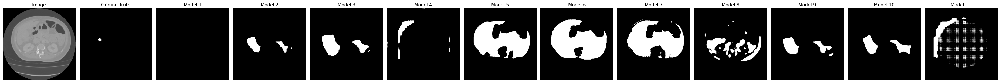

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


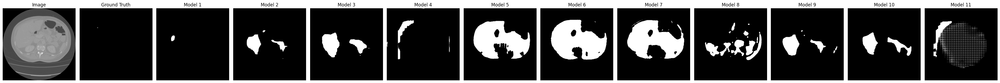

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


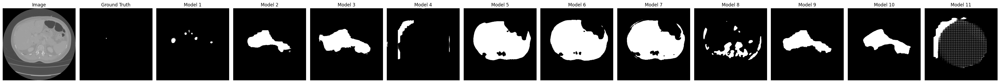

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


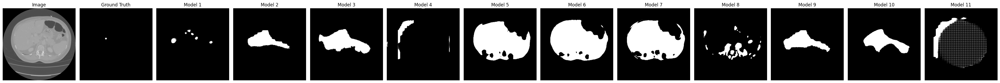

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


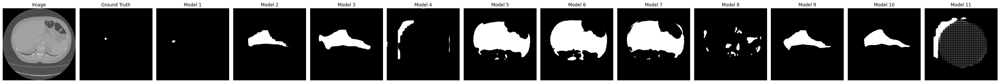

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


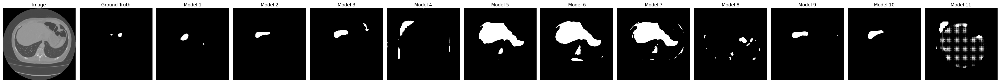

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


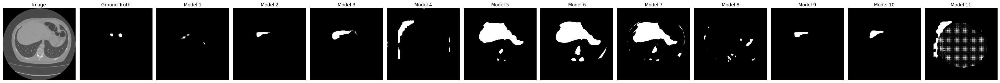

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


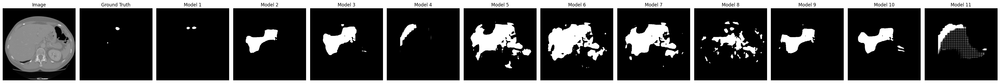

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


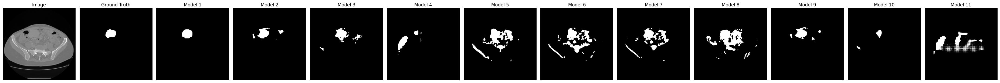

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


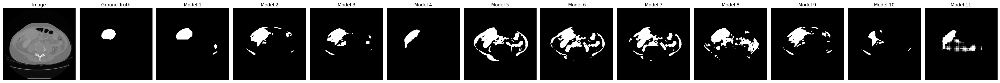

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


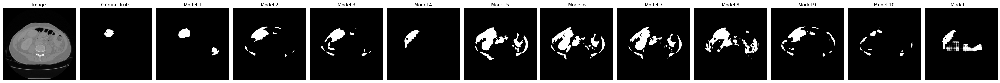

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


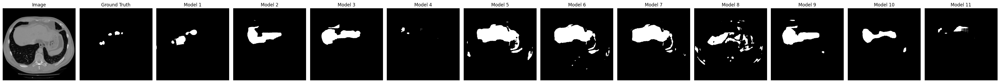

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


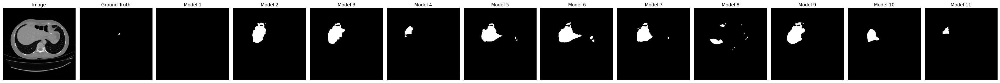

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


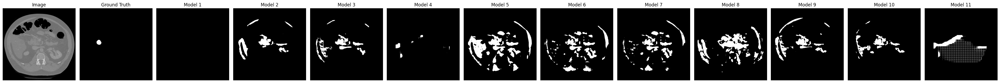

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


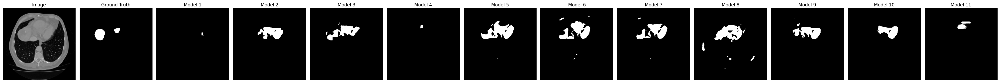

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


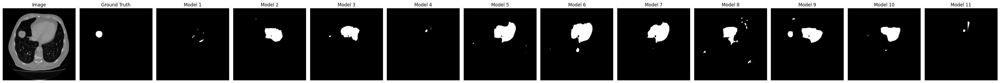

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


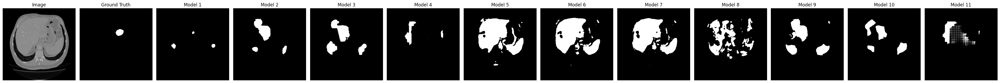

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


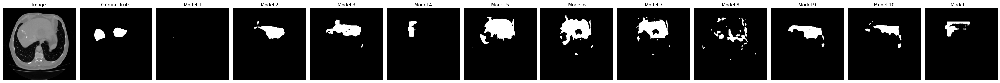

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


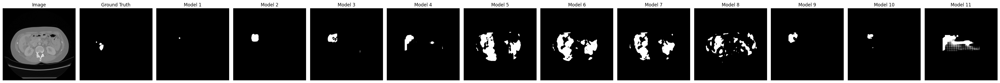

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


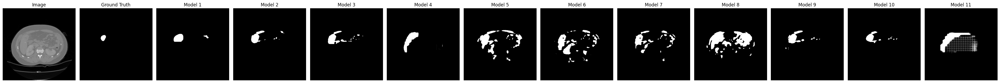

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


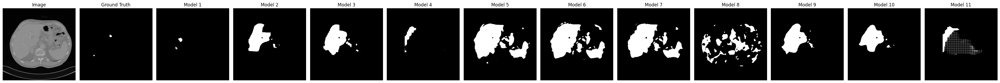

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


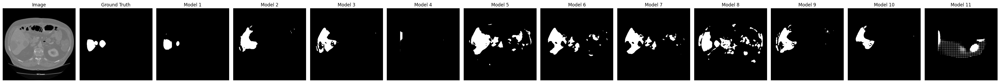

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


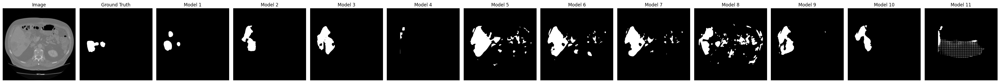

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


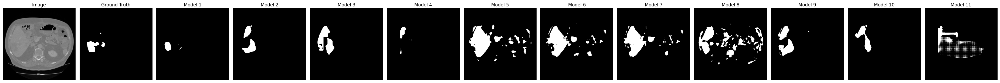

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


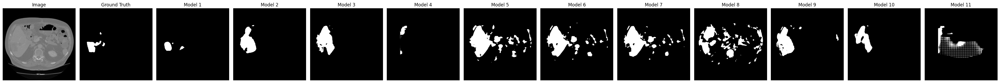

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


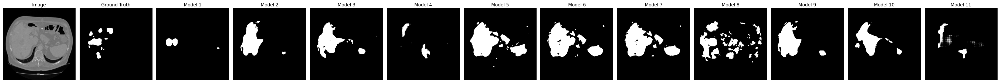

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


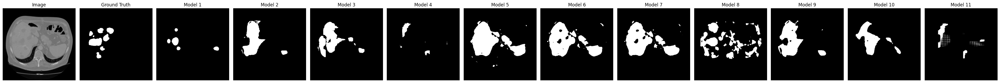

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


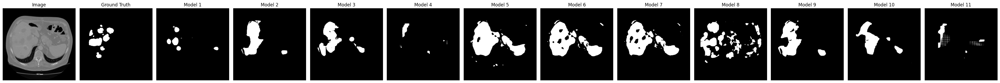

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


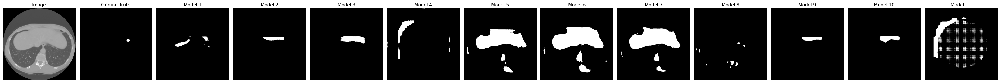

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


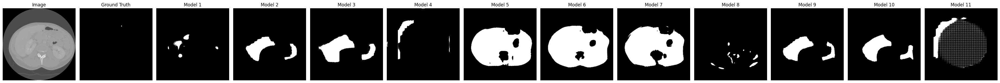

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


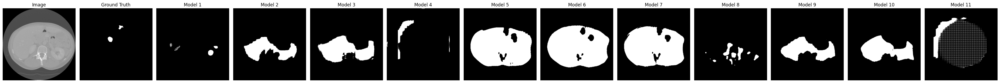

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


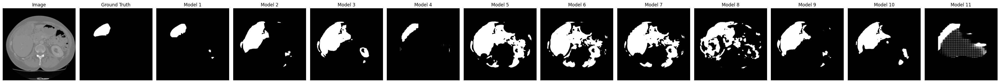

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


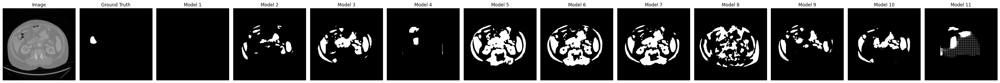

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


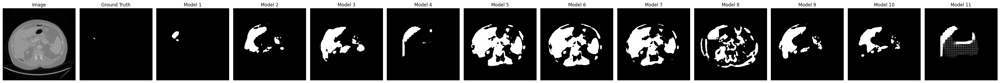

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


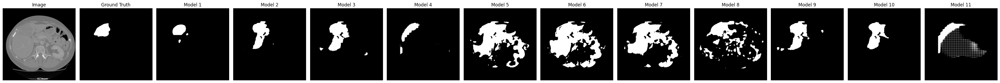

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


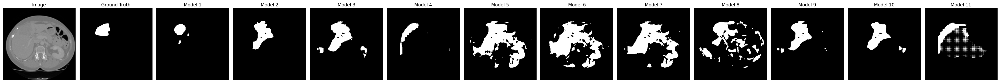

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


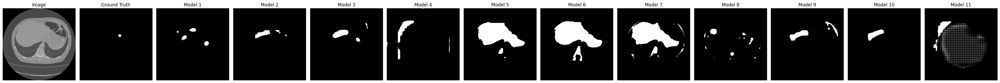

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


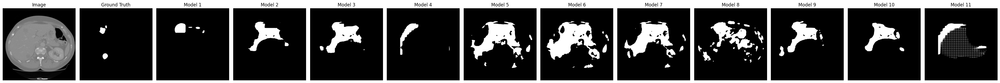

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


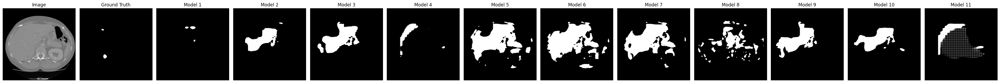

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


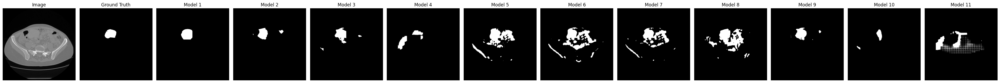

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


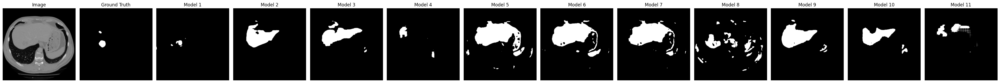

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


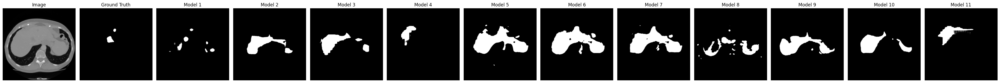

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


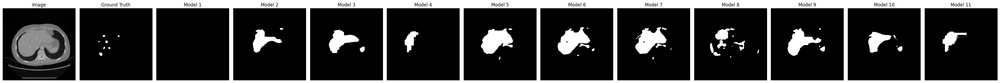

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


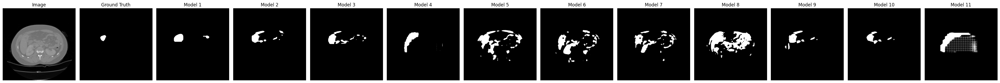

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


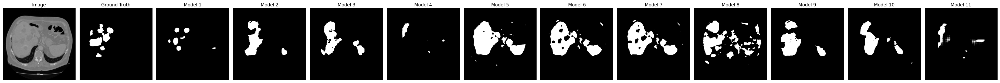

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


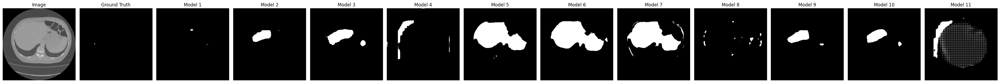

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


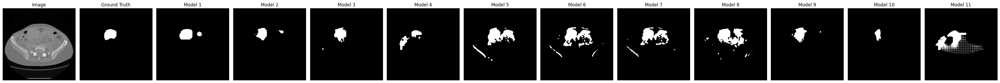

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


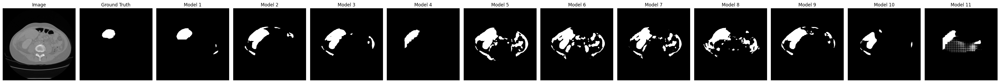

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


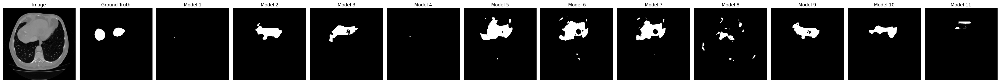

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


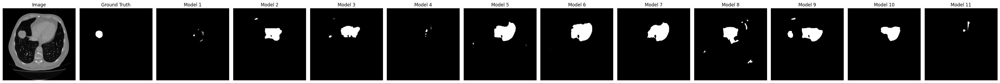

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


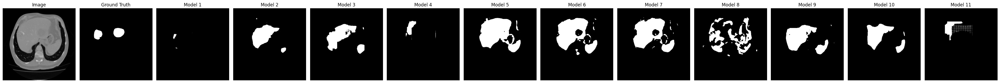

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


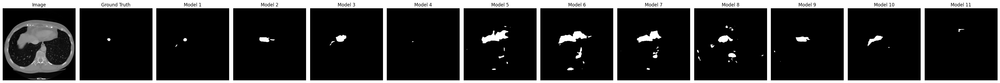

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


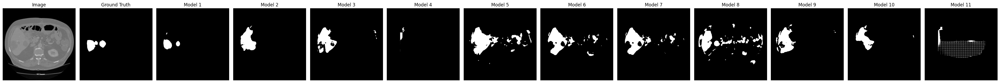

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


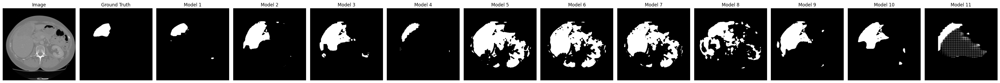

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


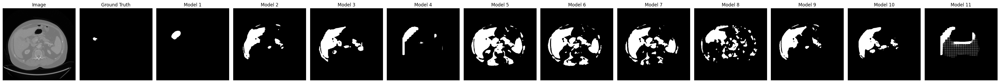

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


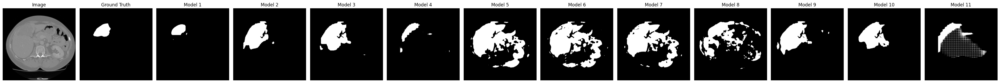

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


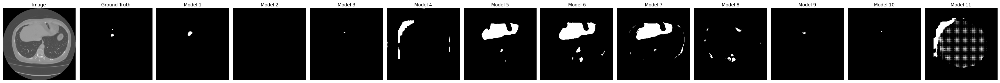

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model Function ===
def load_model_with_weights(model_path, input_shape=(512, 512, 1)):
    model_instance = UNetPlusPlus(input_shape=input_shape)
    model = model_instance.BuildNetwork()
    model.load_weights(model_path)
    return model

# === Set Directories and Load Images ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)
# === Define Your Model Paths ===
model_paths = [
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_twolayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_threelayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fourlayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_first_fivelayer.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloowlayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_morelayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_encode_and_shaloow_deeperlayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_denselayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_seconddenselayers.h5",
    "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_initial_second_third_denselayers.h5"
]

# === Load All Models ===
models = [load_model_with_weights(path) for path in model_paths]

# === Predict and Visualize in One Row ===
for i in range(len(images)):
    image = np.expand_dims(images[i], axis=0)
    preds_all = [(model.predict(image) > 0.5).astype(np.float32).squeeze() for model in models]

    plt.figure(figsize=(40, 4))

    # Display Original Image
    plt.subplot(1, 14, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title("Image")
    plt.axis('off')

    # Display Ground Truth
    plt.subplot(1, 14, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    # Display Predictions: Model 1 to Model 12
    for j, pred in enumerate(preds_all):
        plt.subplot(1, 14, j + 3)
        plt.imshow(pred, cmap='gray')
        plt.title(f"Model {j+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Overall metrics
overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)
print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect per-image stats ===
stats = []
total_tp, total_fp, total_fn = 0, 0, 0

for i in range(len(images)):
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Per-image Dice & IoU
    dsc = dice_score(gt, pred)
    iou = iou_score(gt, pred)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    tp_count, fp_count, fn_count = int(np.sum(TP)), int(np.sum(FP)), int(np.sum(FN))
    total_tp += tp_count
    total_fp += fp_count
    total_fn += fn_count

    stats.append({
        "Image": image_ids[i],
        "Dice": dsc,
        "IoU": iou,
        "TP_count": tp_count,
        "FP_count": fp_count,
        "FN_count": fn_count
    })

    # === Visualization: Image | GT | Prediction ===
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# === Create DataFrame ===
df_stats = pd.DataFrame(stats)
print(df_stats.head())

# === Print totals ===
print("\n=== Total Pixel Counts Across Validation Set ===")
print(f"Total True Positives (TP): {total_tp}")
print(f"Total False Positives (FP): {total_fp}")
print(f"Total False Negatives (FN): {total_fn}")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Overall metrics
overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)
print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect per-image stats ===
stats = []
total_tp, total_fp, total_fn = 0, 0, 0

for i in range(len(images)):
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Per-image Dice & IoU
    dsc = dice_score(gt, pred)
    iou = iou_score(gt, pred)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    tp_count, fp_count, fn_count = int(np.sum(TP)), int(np.sum(FP)), int(np.sum(FN))
    total_tp += tp_count
    total_fp += fp_count
    total_fn += fn_count

    stats.append({
        "Image": image_ids[i],
        "Dice": dsc,
        "IoU": iou,
        "TP_count": tp_count,
        "FP_count": fp_count,
        "FN_count": fn_count
    })

    # === Visualization: Image | GT | Prediction ===
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# === Create DataFrame ===
df_stats = pd.DataFrame(stats)
print(df_stats.head())

# === Print totals ===
print("\n=== Total Pixel Counts Across Validation Set ===")
print(f"Total True Positives (TP): {total_tp}")
print(f"Total False Positives (FP): {total_fp}")
print(f"Total False Negatives (FN): {total_fn}")


Output hidden; open in https://colab.research.google.com to view.